In [1]:
# !pip install transformers bertviz transformers-interpret optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 62.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 104.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
# !pip install --force-reinstall numpy pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 104.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 111.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 509.2/509.2 kB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 347.8/347.8 kB 27.5 MB/s eta 0:00:00
  Attempting uninstall: pytz
    Found existing installation: pytz 2025.2
    Uninstalling pytz-2025.2:
      Successfully uninstalled pytz-2025.2
  Attempting uninstall: tzdata
    Found existing installation: tzdata 2025.2
    Uninstalling tzdata-2025.2:
      Successfully uninstalled tzdata-2025.2
  Attempting uninstall: six
    Found existing installation: six 1.17.0
    Uninstalling six-1.17.0:
      Successfully uninstalled six

In [1]:
import os
import json
import shutil
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from transformers import (
    AutoConfig,
    AutoTokenizer,
    AutoModelForSequenceClassification,
    AutoModel,
    Trainer,
    TrainingArguments,
    EarlyStoppingCallback
)
from bertviz import head_view
from transformers_interpret import SequenceClassificationExplainer
import optuna

os.environ["WANDB_DISABLED"] = "true"

In [2]:
# ================================
# 1. Data Loading and Preprocessing
# ================================

In [3]:
# Load training data
df = pd.read_csv("/content/MLHC_train_2ndApril.csv")

# Map triage levels to numerical labels
triage_mapping = {
    "Immediate.": 0,
    "Emergent.": 1,
    "Urgent.": 2,
    "Semi-urgent.": 3,
    "Nonurgent.": 4
}
df["triage_value"] = df["triage_level"].map(triage_mapping)
df.dropna(inplace=True)

# Split the data into training and validation sets with stratification
train_texts, val_texts, train_labels, val_labels = train_test_split(
    df["text_data"].tolist(),
    df["triage_value"].tolist(),
    test_size=0.2,
    random_state=42,
    stratify=df["triage_value"].tolist()
)


In [4]:
# ================================
# 2. Tokenization and Dataset Preparation
# ================================

In [5]:
model_checkpoint = "emilyalsentzer/Bio_ClinicalBERT"
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)
max_length = 256

def tokenize_data(texts):
    return tokenizer(texts, padding="max_length", truncation=True, max_length=max_length)

train_encodings = tokenize_data(train_texts)
val_encodings = tokenize_data(val_texts)

class TriageDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __len__(self):
        return len(self.labels)
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item

train_dataset = TriageDataset(train_encodings, train_labels)
val_dataset = TriageDataset(val_encodings, val_labels)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

In [6]:
# ================================
# 3. Model Setup and Initial Training
# ================================

In [7]:

# Load model configuration and model
config = AutoConfig.from_pretrained(
    model_checkpoint,
    num_labels=5,
    problem_type="single_label_classification",
)
model = AutoModelForSequenceClassification.from_pretrained(model_checkpoint, config=config)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define evaluation metrics function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    probabilities = F.softmax(torch.tensor(logits), dim=-1).numpy()
    auc_score = roc_auc_score(labels, probabilities, multi_class='ovr', labels=[0, 1, 2, 3, 4])
    predictions = np.argmax(probabilities, axis=-1)
    accuracy = accuracy_score(labels, predictions)
    return {"eval_auc": auc_score, "accuracy": accuracy}

# Set training arguments (using step-based evaluation)
training_args = TrainingArguments(
    output_dir="./clinicalbert_triage",
    evaluation_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    learning_rate=3e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=10,
    weight_decay=0.01,
    logging_dir="./logs",
    logging_strategy="steps",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="eval_auc",
    greater_is_better=True,
    report_to="none",
    warmup_steps=200,
    fp16=torch.cuda.is_available(),
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

trainer.train()

pytorch_model.bin:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.052100,0.997042,0.714429,0.574899
400,0.995800,0.977156,0.757913,0.582490
600,0.927300,0.963191,0.763745,0.598684
800,0.920700,0.970487,0.756874,0.590081
1000,0.891500,0.971040,0.759194,0.590081
1200,0.857900,0.978099,0.760347,0.601215


TrainOutput(global_step=1200, training_loss=0.96606369972229, metrics={'train_runtime': 104.6458, 'train_samples_per_second': 755.31, 'train_steps_per_second': 23.603, 'total_flos': 5051868335308800.0, 'train_loss': 0.96606369972229, 'epoch': 4.8582995951417})

In [8]:
# ================================
# 4. Hyperparameter Tuning using Optuna
# ================================

In [9]:

fixed_epochs = 5
fixed_warmup_steps = 200

# Function to initialize a fresh model
def model_init():
    return AutoModelForSequenceClassification.from_pretrained(model_checkpoint, config=config)

# Define the hyperparameter search space
def hp_space(trial):
    return {
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
        "per_device_train_batch_size": trial.suggest_categorical("per_device_train_batch_size", [16, 32, 64]),
        "weight_decay": trial.suggest_float("weight_decay", 0.0, 0.1, step=0.01),
        "hidden_dropout_prob": trial.suggest_float("hidden_dropout_prob", 0.1, 0.5, step=0.1)
    }

hp_training_args = TrainingArguments(
    output_dir="./clinicalbert_triage_hp",
    evaluation_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    learning_rate=2e-5,  # placeholder value
    per_device_train_batch_size=16,  # placeholder value
    per_device_eval_batch_size=16,
    num_train_epochs=fixed_epochs,
    weight_decay=0.01,  # placeholder value
    logging_dir="./logs",
    logging_strategy="steps",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="eval_auc",
    greater_is_better=True,
    report_to="none",
    warmup_steps=fixed_warmup_steps,
    fp16=torch.cuda.is_available(),
)

hp_trainer = Trainer(
    model_init=model_init,
    args=hp_training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

best_run = hp_trainer.hyperparameter_search(
    hp_space=hp_space,
    direction="maximize",
    n_trials=10,
    compute_objective=lambda metrics: metrics["eval_auc"]
)
print("Best hyperparameters:", best_run.hyperparameters)
print("Best run:", best_run)

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
[I 2025-04-02 00:19:05,003] A new study created in memory with name: no-name-5fcb85a8-41fb-4b5c-a52f-7793dda4b81d
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://g

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.075400,1.030598,0.719735,0.559717
400,0.953300,0.976247,0.745136,0.593623
600,0.910300,0.967513,0.750830,0.600202


[I 2025-04-02 00:20:30,601] Trial 0 finished with value: 0.7508304697652397 and parameters: {'learning_rate': 1.6654276321407426e-05, 'per_device_train_batch_size': 64, 'weight_decay': 0.0, 'hidden_dropout_prob': 0.4}. Best is trial 0 with value: 0.7508304697652397.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and 

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.090100,1.038910,0.713876,0.541498
400,1.000100,0.990160,0.742815,0.587045
600,0.927700,0.970754,0.752666,0.595648
800,0.925100,0.961168,0.759999,0.611842
1000,0.896500,0.958794,0.757398,0.593623
1200,0.867900,0.962312,0.757008,0.597672


[I 2025-04-02 00:22:21,382] Trial 1 finished with value: 0.7570083956156968 and parameters: {'learning_rate': 2.030098670003576e-05, 'per_device_train_batch_size': 32, 'weight_decay': 0.03, 'hidden_dropout_prob': 0.2}. Best is trial 1 with value: 0.7570083956156968.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and 

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.099200,1.078157,0.673214,0.529352
400,0.998100,0.992288,0.751839,0.584514
600,0.983300,0.997591,0.747398,0.580466
800,0.955600,0.990889,0.747085,0.577935
1000,0.993200,0.979727,0.749938,0.583502


[I 2025-04-02 00:23:36,377] Trial 2 finished with value: 0.7499377646177026 and parameters: {'learning_rate': 4.1002375840828537e-05, 'per_device_train_batch_size': 16, 'weight_decay': 0.04, 'hidden_dropout_prob': 0.5}. Best is trial 1 with value: 0.7570083956156968.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.095200,1.073442,0.699407,0.507591
400,0.970900,0.979419,0.740021,0.587551
600,0.937500,0.970911,0.744937,0.597166


[I 2025-04-02 00:25:02,118] Trial 3 finished with value: 0.7449373264755976 and parameters: {'learning_rate': 1.0466271985852627e-05, 'per_device_train_batch_size': 64, 'weight_decay': 0.02, 'hidden_dropout_prob': 0.5}. Best is trial 1 with value: 0.7570083956156968.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.015600,0.993713,0.726132,0.567308
400,0.992000,0.987759,0.751071,0.592105
600,0.910000,0.964193,0.761581,0.587551
800,0.893000,0.977240,0.754553,0.596660
1000,0.858700,0.967848,0.756705,0.594130
1200,0.827900,0.974123,0.755348,0.596660


[I 2025-04-02 00:26:47,831] Trial 4 finished with value: 0.7553475733093888 and parameters: {'learning_rate': 4.1571043232690206e-05, 'per_device_train_batch_size': 32, 'weight_decay': 0.04, 'hidden_dropout_prob': 0.2}. Best is trial 1 with value: 0.7570083956156968.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.038900,1.016877,0.721158,0.581478
400,0.948000,0.967375,0.749626,0.601215
600,0.891800,0.965339,0.751858,0.600202


[I 2025-04-02 00:28:13,363] Trial 5 finished with value: 0.7518578900823074 and parameters: {'learning_rate': 2.226655655563591e-05, 'per_device_train_batch_size': 64, 'weight_decay': 0.1, 'hidden_dropout_prob': 0.2}. Best is trial 1 with value: 0.7570083956156968.
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and i

Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.094000,1.053895,0.704807,0.545547


[I 2025-04-02 00:28:27,006] Trial 6 pruned. 
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.113200,1.085829,0.661511,0.528846


[I 2025-04-02 00:28:40,735] Trial 7 pruned. 
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.103300,1.101931,0.622913,0.522773


[I 2025-04-02 00:28:54,323] Trial 8 pruned. 
<ipython-input-9-e2bccce1653b>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 5e-5),
Trying to set hidden_dropout_prob in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.102700,1.088309,0.669008,0.530364


[I 2025-04-02 00:29:10,801] Trial 9 pruned. 


Best hyperparameters: {'learning_rate': 2.030098670003576e-05, 'per_device_train_batch_size': 32, 'weight_decay': 0.03, 'hidden_dropout_prob': 0.2}
Best run: BestRun(run_id='1', objective=0.7570083956156968, hyperparameters={'learning_rate': 2.030098670003576e-05, 'per_device_train_batch_size': 32, 'weight_decay': 0.03, 'hidden_dropout_prob': 0.2}, run_summary=None)


In [10]:
# ================================
# 5. Final Model Training with Best Hyperparameters
# ================================

In [11]:

best_params = best_run.hyperparameters

final_training_args = TrainingArguments(
    output_dir="./final_clinicalbert_model",
    evaluation_strategy="steps",
    eval_steps=200,
    save_strategy="steps",
    save_steps=200,
    learning_rate=best_params["learning_rate"],
    per_device_train_batch_size=best_params["per_device_train_batch_size"],
    per_device_eval_batch_size=16,
    num_train_epochs=fixed_epochs,
    weight_decay=best_params["weight_decay"],
    logging_dir="./logs",
    logging_strategy="steps",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="eval_auc",
    greater_is_better=True,
    report_to="none",
    warmup_steps=fixed_warmup_steps,
    fp16=torch.cuda.is_available(),
)

final_trainer = Trainer(
    model_init=model_init,
    args=final_training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

final_trainer.train()
final_trainer.save_model("./final_clinicalbert_model")
shutil.make_archive("./final_clinicalbert_model", 'zip', "./final_clinicalbert_model")


/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1611: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at emilyalsentzer/Bio_ClinicalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Auc,Accuracy
200,1.090200,1.039759,0.713686,0.537955
400,1.000900,0.988849,0.737855,0.587045
600,0.927700,0.971725,0.752160,0.592105
800,0.922900,0.960968,0.761814,0.608806
1000,0.898000,0.957046,0.759201,0.594130
1200,0.866300,0.961294,0.758186,0.597672


'/content/final_clinicalbert_model.zip'

In [12]:
# ================================
# 6. Visualization of Attention using BERTViz
# ================================

In [13]:

# Load the final model for visualization with attention outputs enabled
viz_model = AutoModel.from_pretrained("./final_clinicalbert_model", output_attentions=True)
viz_tokenizer = AutoTokenizer.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")

# Choose a sample text from the validation set
sample_text_viz = val_texts[8]
truncated_text_viz = " ".join(sample_text_viz.split())

viz_inputs = viz_tokenizer.encode_plus(
    truncated_text_viz,
    return_tensors="pt",
    max_length=50,
    truncation=True,
)

viz_outputs = viz_model(**viz_inputs)
# Get all attention tensors (one per layer)
attentions = viz_outputs[-1]

# Convert input IDs to tokens
viz_tokens = viz_tokenizer.convert_ids_to_tokens(viz_inputs["input_ids"][0])

# Optional threshold filtering for visualization
threshold = 0.018
filtered_attentions = [
    torch.where(layer_att > threshold, layer_att, torch.zeros_like(layer_att))
    for layer_att in attentions
]

# Remove special tokens and punctuation from the visualization
special_tokens = {"[CLS]", "[SEP]"}
punctuation_tokens = {":", ",", ".", "-"}

filtered_indices = [i for i, token in enumerate(viz_tokens)
                    if token not in special_tokens and token not in punctuation_tokens]
filtered_tokens = [viz_tokens[i] for i in filtered_indices]

def filter_attention(attentions, indices):
    filtered_atts = []
    for att in attentions:
        att = att.squeeze(0)  # shape: [num_heads, seq_len, seq_len]
        att_filtered = att[:, indices, :][:, :, indices]
        filtered_atts.append(att_filtered.unsqueeze(0))
    return filtered_atts

filtered_attentions_final = filter_attention(attentions, filtered_indices)
head_view(filtered_attentions_final, filtered_tokens)


BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


<IPython.core.display.Javascript object>

In [14]:
# ================================
# 7. Aggregated Token Importances
# ================================

In [15]:

attentions_tensor = torch.stack(attentions, dim=0).squeeze(1)  # [num_layers, num_heads, seq_len, seq_len]
avg_attentions = attentions_tensor.mean(dim=0).mean(dim=0)       # [seq_len, seq_len]
token_importance = avg_attentions.sum(dim=0)                     # [seq_len]
importance_scores = token_importance.detach().cpu().numpy()

sorted_indices = np.argsort(importance_scores)[::-1]
filtered_sorted_indices = [
    i for i in sorted_indices
    if viz_tokens[i] not in special_tokens and viz_tokens[i] not in punctuation_tokens
]

print("\nToken importances (only tokens with importance > 0.5):")
for idx in filtered_sorted_indices:
    if importance_scores[idx] > 0.5:
        print(f"Token: {viz_tokens[idx]:15s} Importance: {importance_scores[idx]:.4f}")



Token importances (only tokens with importance > 0.5):
Token: vehicle         Importance: 1.1585
Token: vital           Importance: 0.9167
Token: visit           Importance: 0.8507
Token: arrived         Importance: 0.8186
Token: reported        Importance: 0.7970
Token: swelling        Importance: 0.7162
Token: pig             Importance: 0.6941
Token: recorded        Importance: 0.6609
Token: following       Importance: 0.6607
Token: or              Importance: 0.6421
Token: female          Importance: 0.6381
Token: ##mentation     Importance: 0.6163
Token: ##lora          Importance: 0.6153
Token: ##tion          Importance: 0.5860
Token: the             Importance: 0.5837
Token: by              Importance: 0.5771
Token: complaint       Importance: 0.5708
Token: with            Importance: 0.5629
Token: hand            Importance: 0.5582
Token: non             Importance: 0.5509
Token: disco           Importance: 0.5449
Token: a               Importance: 0.5426
Token: injury       

In [16]:
# ================================
# 8. Interpretability using Transformers Interpret
# ================================

In [17]:
final_model = AutoModelForSequenceClassification.from_pretrained("./final_clinicalbert_model")
tokenizer = AutoTokenizer.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")
explainer = SequenceClassificationExplainer(final_model, tokenizer)

# Group training texts by label and compute attributions
samples_by_label = defaultdict(list)
for text, label in zip(train_texts, train_labels):
    samples_by_label[label].append(text)

for label in sorted(samples_by_label.keys()):
    sample_text_expl = samples_by_label[label][0]
    print(f"\n=== Triage Level {label} ===")
    attributions = explainer(sample_text_expl)
    # This will display an interactive explanation visualization
    explainer.visualize()


=== Triage Level 0 ===



=== Triage Level 1 ===



=== Triage Level 2 ===



=== Triage Level 3 ===



=== Triage Level 4 ===


In [18]:
# ================================
# 9. Evaluation on Test Data
# ================================

Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


Numeric Metrics (without temperature calibration):
----------------
Accuracy: 0.6295
AUC (weighted, OvR): 0.7779
Percentage Underreporting: 42.50%
Percentage Overreporting: 57.50%
Mean Predicted Probability: 0.6050


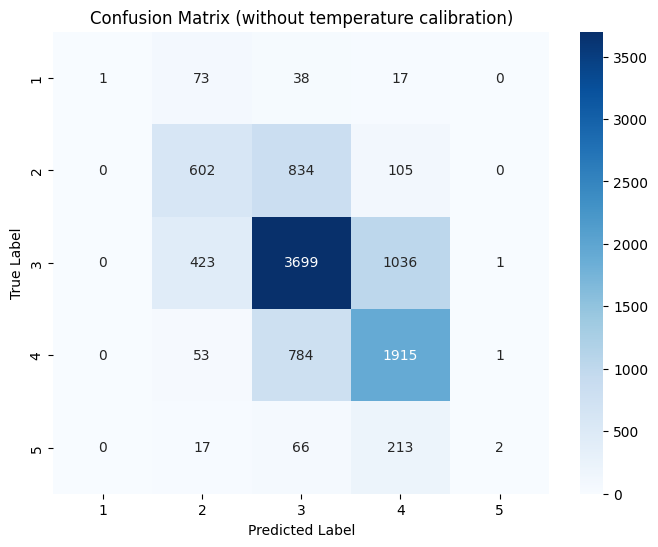

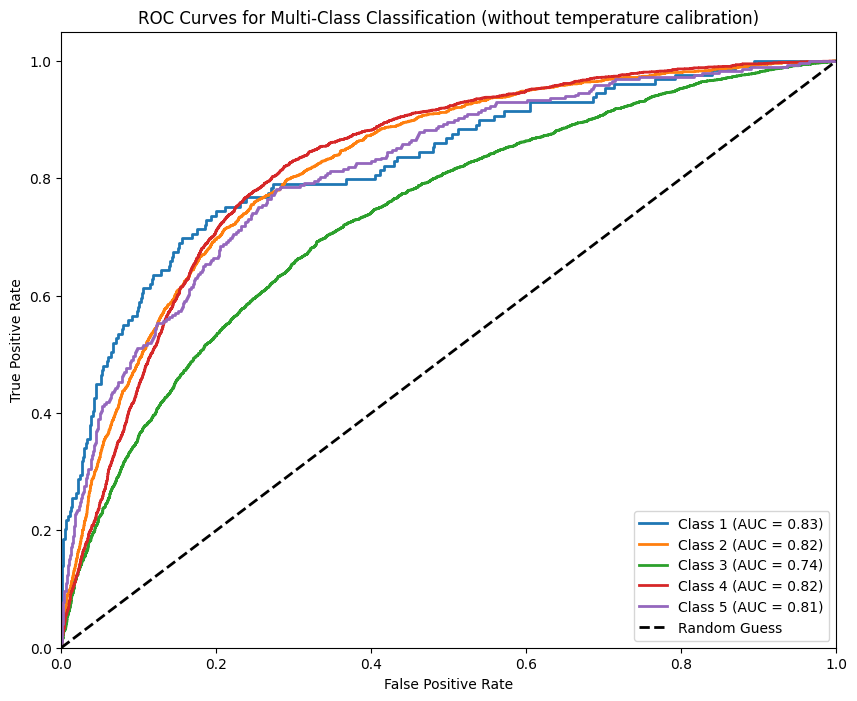

Temperature: 0.50, NLL: 1.0387
Temperature: 1.00, NLL: 0.8969
Temperature: 1.50, NLL: 0.9584
Temperature: 2.00, NLL: 1.0373
Temperature: 2.50, NLL: 1.1066

Optimal Temperature: 1.0 with NLL: 0.8968886137008667

Numeric Metrics (with optimal temperature calibration):
----------------
Accuracy: 0.6295
AUC (weighted, OvR): 0.7779
Mean Predicted Probability: 0.6050


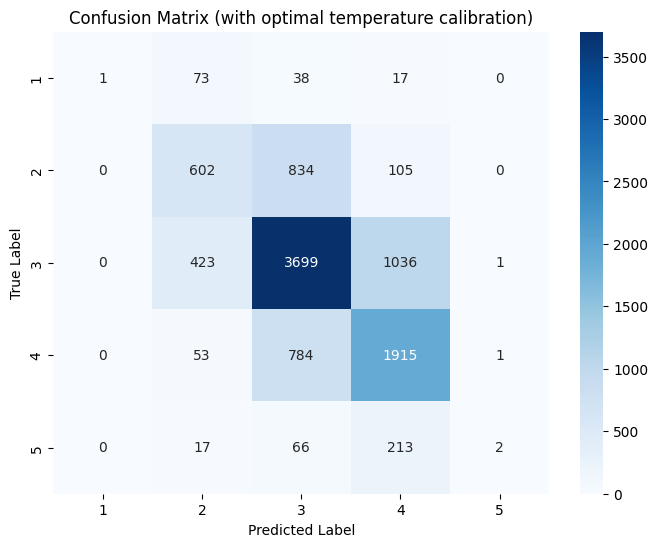

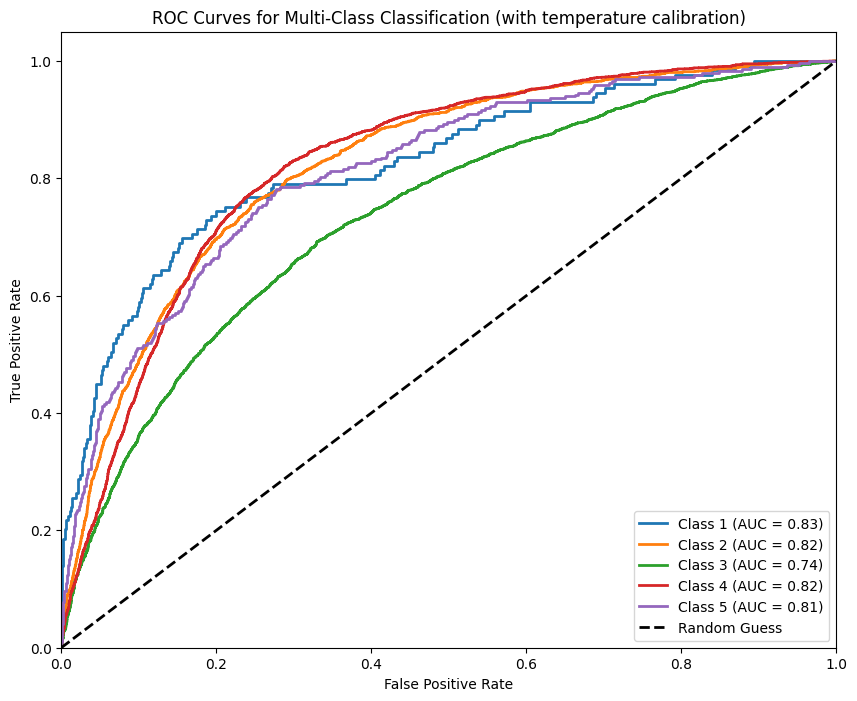


Mean Entropy with Optimal Temperature Calibration: 0.9442


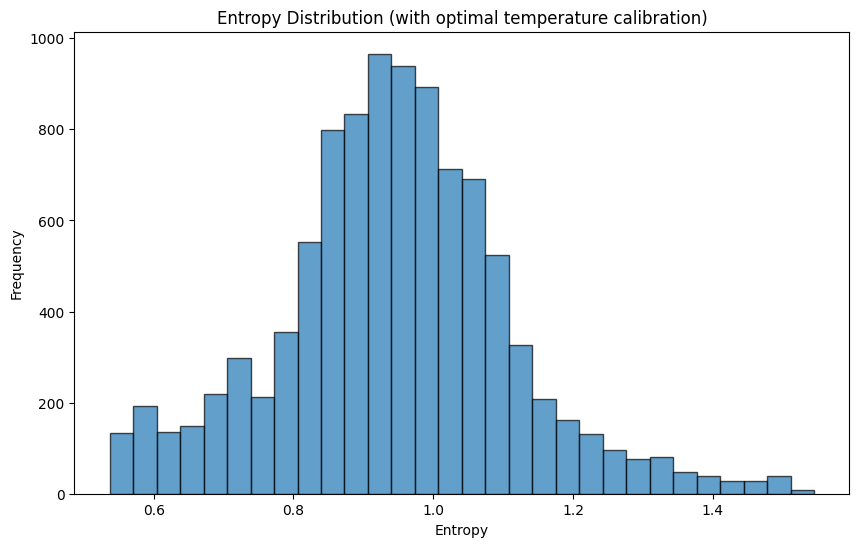

In [19]:
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix,
    roc_curve, auc
)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize
import torch
import torch.nn.functional as F
import numpy as np

# -------------------------------
# Helper Functions for Temperature Scaling & Calibration
# -------------------------------

def apply_temperature(logits, temperature):
    """Scale logits by the temperature factor."""
    return logits / temperature

def softmax_with_temperature(logits, temperature):
    """Apply temperature scaling then softmax."""
    scaled_logits = apply_temperature(logits, temperature)
    return F.softmax(scaled_logits, dim=1)

def negative_log_likelihood(probs, labels):
    """
    Compute the negative log likelihood.
    probs: numpy array of shape (num_samples, num_classes)
    labels: true labels (list or array)
    """
    labels = torch.tensor(labels)
    probs_tensor = torch.tensor(probs)
    # Get the probability of the correct class for each sample
    correct_class_probs = probs_tensor[range(len(labels)), labels]
    nll = -torch.mean(torch.log(correct_class_probs + 1e-8))
    return nll.item()

def find_optimal_temperature(logits, labels, temperature_values):
    """
    Searches for the temperature that minimizes negative log likelihood.
    Returns the optimal temperature and its NLL.
    """
    best_temp = None
    best_nll = float("inf")
    logits_tensor = torch.tensor(logits)
    for temp in temperature_values:
        probs_temp = softmax_with_temperature(logits_tensor, temp).detach().numpy()
        nll = negative_log_likelihood(probs_temp, labels)
        print(f"Temperature: {temp:.2f}, NLL: {nll:.4f}")
        if nll < best_nll:
            best_nll = nll
            best_temp = temp
    return best_temp, best_nll

def calculate_entropy(probabilities):
    """Calculate entropy for each sample's probability distribution."""
    epsilon = 1e-8
    return -np.sum(probabilities * np.log(probabilities + epsilon), axis=1)

# -------------------------------
# Evaluation on Test Data
# -------------------------------

# Load and prepare test data
df1 = pd.read_csv("/content/MLHC_train_2ndApril.csv")
df1["triage_value"] = df1["triage_level"].map(triage_mapping)

eval_texts = df1["text_data"].tolist()
eval_labels = df1["triage_value"].tolist()

eval_encodings = tokenizer(eval_texts, padding="max_length", truncation=True, max_length=max_length)
eval_dataset = TriageDataset(eval_encodings, eval_labels)
df1 = df1[:200]  # Optionally use a subset

# Evaluate with your final model using the Trainer
eval_trainer = Trainer(model=final_model)
preds_output = eval_trainer.predict(eval_dataset)
logits = preds_output.predictions   # shape: (num_samples, num_classes)
labels = preds_output.label_ids      # shape: (num_samples,)

# Baseline: Convert logits to probabilities using default softmax
probs = F.softmax(torch.tensor(logits), dim=1).detach().numpy()
preds = np.argmax(probs, axis=1)

# Compute baseline metrics
accuracy_val = accuracy_score(labels, preds)
try:
    auc_value = roc_auc_score(labels, probs, multi_class="ovr", average="weighted")
except Exception as e:
    auc_value = float("nan")
cm = confusion_matrix(labels, preds)

wrong_mask = preds != labels
if np.sum(wrong_mask) > 0:
    pct_underreport = np.mean(preds[wrong_mask] < labels[wrong_mask]) * 100
    pct_overreport  = np.mean(preds[wrong_mask] > labels[wrong_mask]) * 100
else:
    pct_underreport = pct_overreport = 0

mean_prob = np.mean(np.max(probs, axis=1))

print("Numeric Metrics (without temperature calibration):")
print("----------------")
print(f"Accuracy: {accuracy_val:.4f}")
print(f"AUC (weighted, OvR): {auc_value:.4f}")
print(f"Percentage Underreporting: {pct_underreport:.2f}%")
print(f"Percentage Overreporting: {pct_overreport:.2f}%")
print(f"Mean Predicted Probability: {mean_prob:.4f}")

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=[f"{i+1}" for i in range(cm.shape[0])],
            yticklabels=[f"{i+1}" for i in range(cm.shape[0])])
plt.title("Confusion Matrix (without temperature calibration)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Plot ROC Curves for Multi-Class (without temperature calibration)
n_classes = probs.shape[1]
labels_binarized = label_binarize(labels, classes=list(range(n_classes)))
fpr = {}
tpr = {}
roc_auc_dict = {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(labels_binarized[:, i], probs[:, i])
    roc_auc_dict[i] = auc(fpr[i], tpr[i])
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"Class {i+1} (AUC = {roc_auc_dict[i]:.2f})")
plt.plot([0, 1], [0, 1], "k--", lw=2, label="Random Guess")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Multi-Class Classification (without temperature calibration)")
plt.legend(loc="lower right")
plt.show()

# -------------------------------
# Temperature Calibration: Find Optimal Temperature
# -------------------------------

# Define a range of temperature values to search
temperature_values = [0.5, 1.0, 1.5, 2.0, 2.5]
optimal_temp, optimal_nll = find_optimal_temperature(logits, labels, temperature_values)
print(f"\nOptimal Temperature: {optimal_temp} with NLL: {optimal_nll}")

# Using optimal temperature, recalculate probabilities and predictions
optimal_probs = softmax_with_temperature(torch.tensor(logits), optimal_temp).detach().numpy()
optimal_preds = np.argmax(optimal_probs, axis=1)

# Compute metrics with temperature calibration
accuracy_opt = accuracy_score(labels, optimal_preds)
try:
    auc_opt = roc_auc_score(labels, optimal_probs, multi_class="ovr", average="weighted")
except Exception as e:
    auc_opt = float("nan")
cm_opt = confusion_matrix(labels, optimal_preds)
mean_prob_opt = np.mean(np.max(optimal_probs, axis=1))

print("\nNumeric Metrics (with optimal temperature calibration):")
print("----------------")
print(f"Accuracy: {accuracy_opt:.4f}")
print(f"AUC (weighted, OvR): {auc_opt:.4f}")
print(f"Mean Predicted Probability: {mean_prob_opt:.4f}")

plt.figure(figsize=(8, 6))
sns.heatmap(cm_opt, annot=True, fmt="d", cmap="Blues",
            xticklabels=[f"{i+1}" for i in range(cm_opt.shape[0])],
            yticklabels=[f"{i+1}" for i in range(cm_opt.shape[0])])
plt.title("Confusion Matrix (with optimal temperature calibration)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Plot ROC Curves for Multi-Class (with temperature calibration)
n_classes_opt = optimal_probs.shape[1]
labels_binarized_opt = label_binarize(labels, classes=list(range(n_classes_opt)))
fpr_opt = {}
tpr_opt = {}
roc_auc_dict_opt = {}
for i in range(n_classes_opt):
    fpr_opt[i], tpr_opt[i], _ = roc_curve(labels_binarized_opt[:, i], optimal_probs[:, i])
    roc_auc_dict_opt[i] = auc(fpr_opt[i], tpr_opt[i])
plt.figure(figsize=(10, 8))
for i in range(n_classes_opt):
    plt.plot(fpr_opt[i], tpr_opt[i], lw=2, label=f"Class {i+1} (AUC = {roc_auc_dict_opt[i]:.2f})")
plt.plot([0, 1], [0, 1], "k--", lw=2, label="Random Guess")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Multi-Class Classification (with temperature calibration)")
plt.legend(loc="lower right")
plt.show()

# -------------------------------
# Uncertainty Quantification: Entropy Calculation & Plotting
# -------------------------------

entropy_values = calculate_entropy(optimal_probs)
mean_entropy = np.mean(entropy_values)
print(f"\nMean Entropy with Optimal Temperature Calibration: {mean_entropy:.4f}")

plt.figure(figsize=(10, 6))
plt.hist(entropy_values, bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('Entropy')
plt.ylabel('Frequency')
plt.title('Entropy Distribution (with optimal temperature calibration)')
plt.show()
